For changes in cloud properties due to pollution (CDNC, cloud fraction) as calculated from daily mean model output, this notebook will investigate the sensitivity of the change to the vertical depth over which the change considered.

In [12]:
import pandas as pd
import xarray as xr
import datetime as dt
import numpy as np
import utils
import wrfpp
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.lines as mlines
import cartopy.crs as ccrs
from pyproj import Transformer
from glob import glob
import string

# Read model output

In [15]:
simulations = {
    "ACI_OPT_2": {
        "microphysics": "Thompson",
        "pollution_state": "polluted",
    },
    "ACI_OPT_2_NO_ANTHRO_NO_FIRES": {
        "microphysics": "Thompson",
        "pollution_state": "clean",
    }
}

seaice = xr.open_dataarray("/mnt/data/model_output/ACI_OPT_2/SEAICE.nc").set_index(Time="XTIME")
landmask = xr.open_dataarray("/mnt/data/model_output/ACI_OPT_2/LANDMASK.nc").set_index(Time="XTIME")
land = (landmask).where(~(seaice>0))
ocean = (land!=1)
seaice = seaice.where(ocean).groupby(seaice.Time.dt.day).mean().sel(day=[15,16,17])

outputpath = "/mnt/data/model_output/thompson_derived_variables"
variables = ["reff", "cdnc", "altitude"]
fnames = [glob(f"{outputpath}/{v}_2020-04-13_2020-04-17.nc")[0] for v in variables]
wrfout = xr.open_mfdataset(fnames)
wrfout = wrfout.rename({"air_density":"cdnc"})
wrfout

/tmp/ipykernel_6505/1385297711.py:21: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  wrfout = xr.open_mfdataset(fnames)
/tmp/ipykernel_6505/1385297711.py:21: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  wrfout = xr.open_mfdataset(fnames)
/tmp/ipykernel_6505/1385297711.py:21: FutureWarning: In a future version of xarray the default val

<xarray.Dataset> Size: 1GB
Dimensions:                                        (simulation: 2, Time: 120,
                                                    bottom_top: 49,
                                                    south_north: 99,
                                                    west_east: 99)
Coordinates:
  * simulation                                     (simulation) <U28 224B 'AC...
    microphysics                                   (simulation) <U8 64B dask.array<chunksize=(2,), meta=np.ndarray>
    pollution_state                                (simulation) <U8 64B dask.array<chunksize=(2,), meta=np.ndarray>
  * Time                                           (Time) datetime64[ns] 960B ...
    XLAT                                           (Time, south_north, west_east) float32 5MB dask.array<chunksize=(120, 99, 99), meta=np.ndarray>
    XLONG                                          (Time, south_north, west_east) float32 5MB dask.array<chunksize=(120, 99, 99), meta=np.ndarray>
    longitude                                      (south_north, west_east) float32 39kB dask.array<chunksize=(99, 99), meta=np.ndarray>
    latitude                                       (south_north, west_east) float32 39kB dask.array<chunksize=(99, 99), meta=np.ndarray>
Dimensions without coordinates: bottom_top, south_north, west_east
Data variables:
    RE_CLOUD_ACI                                   (simulation, Time, bottom_top, south_north, west_east) float32 461MB dask.array<chunksize=(2, 120, 49, 99, 99), meta=np.ndarray>
    cdnc                                           (simulation, Time, bottom_top, south_north, west_east) float32 461MB dask.array<chunksize=(2, 120, 49, 99, 99), meta=np.ndarray>
    Altitude grid box centrepoint above sea level  (simulation, Time, bottom_top, south_north, west_east) float32 461MB dask.array<chunksize=(2, 120, 49, 99, 99), meta=np.ndarray>

In [ ]:
# cf = []
# for sim, meta in simulations.items():
#     print(sim)
#     ds = xr.open_dataset(f"/mnt/data/model_output/{sim}/CLDFRA_2020-04-13_2020-04-17.nc").set_index(Time="XTIME")
#     ds = ds.expand_dims({"simulation":[sim]})
#     ds = ds.assign_coords({
#         "pollution_state": ("simulation",[meta["pollution_state"]]),
#         "longitude": (["south_north","west_east"],ds.XLONG.isel(Time=0).values),
#         "latitude": (["south_north","west_east"],ds.XLAT.isel(Time=0).values),
#     })
#     cf.append(ds)
# cf = xr.concat(cf, dim="simulation")
# wrfout["cf"] = cf

In [17]:
aod = []
for sim, meta in simulations.items():
    print(sim)
    ds = xr.open_dataset(f"/mnt/data/model_output/{sim}/AOD2D_OUT_2020-04-13_2020-04-17.nc").set_index(Time="XTIME")
    ds = ds.expand_dims({"simulation":[sim]})
    ds = ds.assign_coords({
        "day": ("Time",[T.dt.day for T in ds.Time]),
        "pollution_state": ("simulation",[meta["pollution_state"]]),
        "longitude": (["south_north","west_east"],ds.XLONG.isel(Time=0).values),
        "latitude": (["south_north","west_east"],ds.XLAT.isel(Time=0).values),
    })
    aod.append(ds)
aod = xr.concat(aod, dim="simulation")
aod_anom = aod.isel(simulation=aod.pollution_state=="polluted").squeeze() - aod.isel(simulation=aod.pollution_state=="clean").squeeze()


ACI_OPT_2
ACI_OPT_2_NO_ANTHRO_NO_FIRES


In [18]:
min_lat = 70
aod_90pc = np.percentile(abs(aod_anom.AOD2D_OUT.values.flatten()), 90)
aod_anom = aod_anom.where(aod_anom.latitude>min_lat)
airmass_flag = (abs(aod_anom.AOD2D_OUT)>aod_90pc)  # True in plume, False otherwise


In [19]:
wrfout_anom = wrfout.sel(simulation=wrfout.pollution_state=="polluted").squeeze() - wrfout.sel(simulation=wrfout.pollution_state=="clean").squeeze()
wrfout_anom = wrfout_anom.groupby(wrfout_anom.Time.dt.day).mean().sel(day=[15,16,17])
airmass_flag = airmass_flag.groupby(airmass_flag.Time.dt.day).any().sel(day=[15,16,17])

In [27]:
def cdnc_z_mean(cdnc, z, z0, z1):
    zvals = z["Altitude grid box centrepoint above sea level"]
    return 1e-6*cdnc.cdnc.where((zvals>=z0)*(zvals<z1)).mean("bottom_top")

def reff_z_mean(reff, z, z0, z1):
    zvals = z["Altitude grid box centrepoint above sea level"]
    return 1e6*reff.RE_CLOUD_ACI.where((zvals>=z0)*(zvals<z1)).mean("bottom_top")


In [7]:
matplotlib.rcParams["font.size"] = 16.0
matplotlib.rcParams["lines.linewidth"] = 2.0
matplotlib.rcParams["axes.linewidth"] = 1.2


In [10]:
transformer = Transformer.from_crs(
    "EPSG:4326",
    ccrs.NorthPolarStereo(central_longitude=-25).proj4_init,
    always_xy=True
)
x, y = transformer.transform(
    wrfout.longitude.values,
    wrfout.latitude.values
)

In [11]:
def plot_sea_ice_extent(ax, seaice, x, y, c="k"):
    ax.contour(
        x, y,
        seaice,
        levels=[0.5],
        colors=[c],
        linestyles=["dashed"],
    )
    return

def plot_airmass_outline(ax, airmass, x, y, c="k"):
    ax.contour(
        x, y,
        (airmass>0),
        levels=[0.5],
        colors=[c],
    )
    return

def plot_mosaic(ax, mosaic):
    ax.plot(
        mosaic.Longitude,
        mosaic.Latitude,
        "r*",
        transform=ccrs.PlateCarree(),
        ms=15,
        mec="w", mfc="r",
    )
    return

Text(0.5, 0.93, 'Lowest 10 levels')

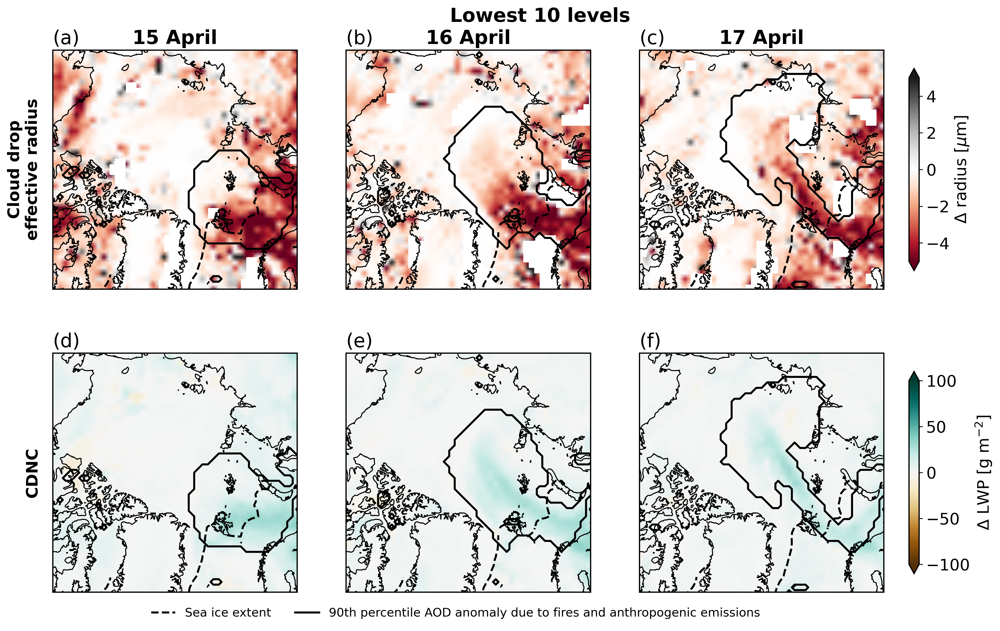

In [22]:
fig, axes = plt.subplots(
    2, 3,
    figsize=(18,10),
    dpi=300,
    subplot_kw=dict(projection=ccrs.NorthPolarStereo(central_longitude=-25))
)
for n,ax in enumerate(axes.flatten()):
    ax.set_extent([-180,180,70,90], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"({string.ascii_lowercase[n]})", loc="left")

for d in range(len(wrfout_anom.day)):
    axes[0,d].set_title(
        f"{wrfout_anom.day.values[d]} April",
        weight="bold"
    )
    r_mesh = axes[0,d].pcolormesh(
        wrfout.longitude,
        wrfout.latitude,
        1e6*wrfout_anom.RE_CLOUD_ACI.isel(day=d, bottom_top=slice(0,10)).mean("bottom_top"),
        transform=ccrs.PlateCarree(),
        cmap="RdGy",
        vmin=-5, vmax=5,
        shading="gouraud"
    )

    c_mesh = axes[1,d].pcolormesh(
        wrfout.longitude,
        wrfout.latitude,
        1e-6*wrfout_anom.cdnc.isel(day=d, bottom_top=slice(0,10)).mean("bottom_top"),
        transform=ccrs.PlateCarree(),
        cmap="BrBG",
        vmin=-100, vmax=100,
        shading="gouraud"
    )

    for r in range(axes.shape[0]):
        plot_sea_ice_extent(axes[r,d], seaice.isel(day=d), x, y)
        plot_airmass_outline(axes[r,d], airmass_flag.isel(day=d), x, y)

plt.colorbar(r_mesh, label="$\\Delta$ radius [$\\mu$m]", ax=axes[0], extend="both", shrink=0.8, pad=0.025)
plt.colorbar(c_mesh, label="$\\Delta$ LWP [g m$^{{-2}}$]", ax=axes[1], extend="both", shrink=0.8, pad=0.025)

axes[0,0].text(
    s="Cloud drop\neffective radius",
    x=-0.05, y=0.5,
    ha="right", va="center",
    multialignment="center",
    transform=axes[0,0].transAxes,
    weight="bold",
    rotation=90,
)

axes[1,0].text(
    s="CDNC",
    x=-0.05, y=0.5,
    ha="right", va="center",
    multialignment="center",
    transform=axes[1,0].transAxes,
    weight="bold",
    rotation=90,
)

legend_handles = [mlines.Line2D([],[],c="k",ls="dashed",label="Sea ice extent")]
legend_handles.append(mlines.Line2D([],[],c="k",label="90th percentile AOD anomaly due to fires and anthropogenic emissions"))
fig.legend(
    ncols=3,
    handles=legend_handles,
    loc="center",
    bbox_to_anchor=(-0.065, 0.04, 1, 0.1),
    edgecolor="None",
    borderaxespad=0.25,
    fontsize=12
)

fig.suptitle("Lowest 10 levels", weight="bold", y=0.93)

In [30]:
altitude = wrfout.isel(simulation=0).groupby(wrfout.Time.dt.day).mean()

Text(0.5, 0.93, '2 km')

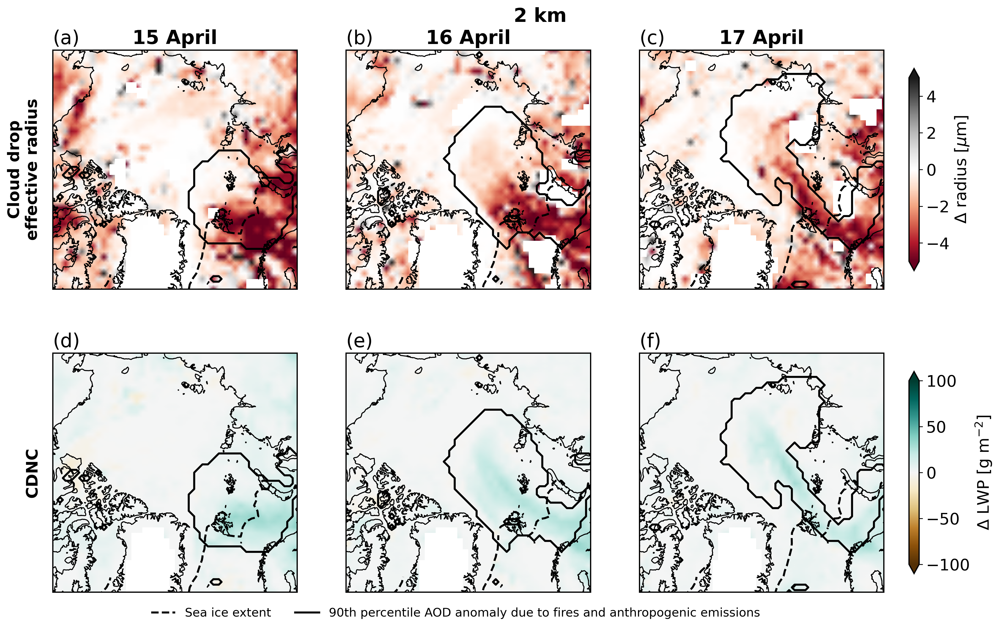

In [31]:


fig, axes = plt.subplots(
    2, 3,
    figsize=(18,10),
    dpi=300,
    subplot_kw=dict(projection=ccrs.NorthPolarStereo(central_longitude=-25))
)
for n,ax in enumerate(axes.flatten()):
    ax.set_extent([-180,180,70,90], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"({string.ascii_lowercase[n]})", loc="left")

for d in range(len(wrfout_anom.day)):
    axes[0,d].set_title(
        f"{wrfout_anom.day.values[d]} April",
        weight="bold"
    )
    r_mesh = axes[0,d].pcolormesh(
        wrfout.longitude,
        wrfout.latitude,
        reff_z_mean(wrfout_anom, altitude, 0, 2000).isel(day=d),
        transform=ccrs.PlateCarree(),
        cmap="RdGy",
        vmin=-5, vmax=5,
        shading="gouraud"
    )

    c_mesh = axes[1,d].pcolormesh(
        wrfout.longitude,
        wrfout.latitude,
        cdnc_z_mean(wrfout_anom, altitude, 0, 2000).isel(day=d),
        transform=ccrs.PlateCarree(),
        cmap="BrBG",
        vmin=-100, vmax=100,
        shading="gouraud"
    )

    for r in range(axes.shape[0]):
        plot_sea_ice_extent(axes[r,d], seaice.isel(day=d), x, y)
        plot_airmass_outline(axes[r,d], airmass_flag.isel(day=d), x, y)

plt.colorbar(r_mesh, label="$\\Delta$ radius [$\\mu$m]", ax=axes[0], extend="both", shrink=0.8, pad=0.025)
plt.colorbar(c_mesh, label="$\\Delta$ LWP [g m$^{{-2}}$]", ax=axes[1], extend="both", shrink=0.8, pad=0.025)

axes[0,0].text(
    s="Cloud drop\neffective radius",
    x=-0.05, y=0.5,
    ha="right", va="center",
    multialignment="center",
    transform=axes[0,0].transAxes,
    weight="bold",
    rotation=90,
)

axes[1,0].text(
    s="CDNC",
    x=-0.05, y=0.5,
    ha="right", va="center",
    multialignment="center",
    transform=axes[1,0].transAxes,
    weight="bold",
    rotation=90,
)

legend_handles = [mlines.Line2D([],[],c="k",ls="dashed",label="Sea ice extent")]
legend_handles.append(mlines.Line2D([],[],c="k",label="90th percentile AOD anomaly due to fires and anthropogenic emissions"))
fig.legend(
    ncols=3,
    handles=legend_handles,
    loc="center",
    bbox_to_anchor=(-0.065, 0.04, 1, 0.1),
    edgecolor="None",
    borderaxespad=0.25,
    fontsize=12
)

fig.suptitle("2 km", weight="bold", y=0.93)

Text(0.5, 0.93, '1 km')

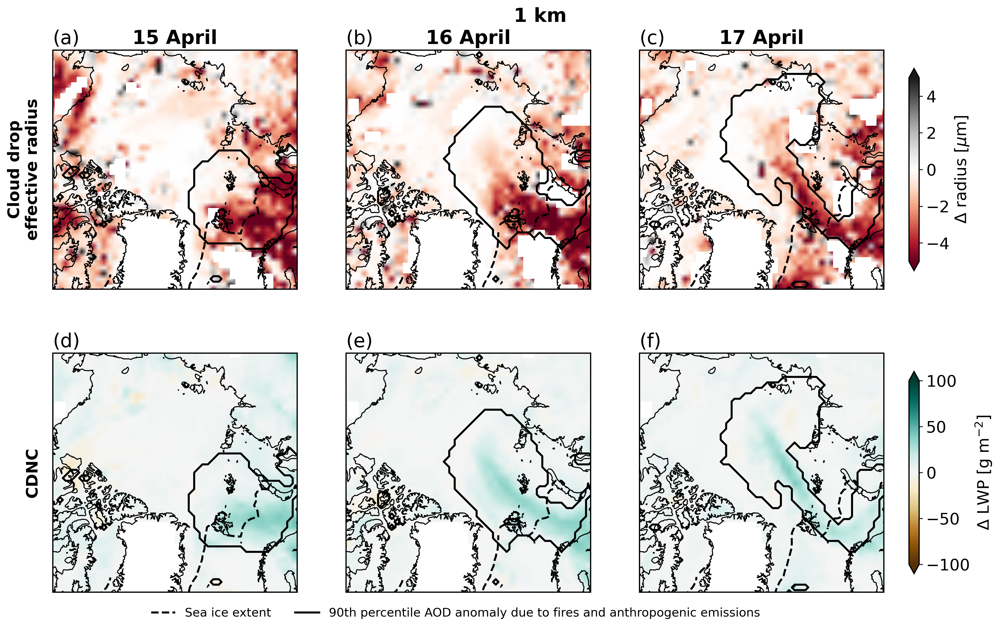

In [32]:
z1 = 1000

fig, axes = plt.subplots(
    2, 3,
    figsize=(18,10),
    dpi=300,
    subplot_kw=dict(projection=ccrs.NorthPolarStereo(central_longitude=-25))
)
for n,ax in enumerate(axes.flatten()):
    ax.set_extent([-180,180,70,90], crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_title(f"({string.ascii_lowercase[n]})", loc="left")

for d in range(len(wrfout_anom.day)):
    axes[0,d].set_title(
        f"{wrfout_anom.day.values[d]} April",
        weight="bold"
    )
    r_mesh = axes[0,d].pcolormesh(
        wrfout.longitude,
        wrfout.latitude,
        reff_z_mean(wrfout_anom, altitude, 0, z1).isel(day=d),
        transform=ccrs.PlateCarree(),
        cmap="RdGy",
        vmin=-5, vmax=5,
        shading="gouraud"
    )

    c_mesh = axes[1,d].pcolormesh(
        wrfout.longitude,
        wrfout.latitude,
        cdnc_z_mean(wrfout_anom, altitude, 0, z1).isel(day=d),
        transform=ccrs.PlateCarree(),
        cmap="BrBG",
        vmin=-100, vmax=100,
        shading="gouraud"
    )

    for r in range(axes.shape[0]):
        plot_sea_ice_extent(axes[r,d], seaice.isel(day=d), x, y)
        plot_airmass_outline(axes[r,d], airmass_flag.isel(day=d), x, y)

plt.colorbar(r_mesh, label="$\\Delta$ radius [$\\mu$m]", ax=axes[0], extend="both", shrink=0.8, pad=0.025)
plt.colorbar(c_mesh, label="$\\Delta$ LWP [g m$^{{-2}}$]", ax=axes[1], extend="both", shrink=0.8, pad=0.025)

axes[0,0].text(
    s="Cloud drop\neffective radius",
    x=-0.05, y=0.5,
    ha="right", va="center",
    multialignment="center",
    transform=axes[0,0].transAxes,
    weight="bold",
    rotation=90,
)

axes[1,0].text(
    s="CDNC",
    x=-0.05, y=0.5,
    ha="right", va="center",
    multialignment="center",
    transform=axes[1,0].transAxes,
    weight="bold",
    rotation=90,
)

legend_handles = [mlines.Line2D([],[],c="k",ls="dashed",label="Sea ice extent")]
legend_handles.append(mlines.Line2D([],[],c="k",label="90th percentile AOD anomaly due to fires and anthropogenic emissions"))
fig.legend(
    ncols=3,
    handles=legend_handles,
    loc="center",
    bbox_to_anchor=(-0.065, 0.04, 1, 0.1),
    edgecolor="None",
    borderaxespad=0.25,
    fontsize=12
)

fig.suptitle(f"{z1/1000:.0f} km", weight="bold", y=0.93)